In [109]:
from keras.models import Sequential
from keras.layers import Embedding, LSTM,Dense, Dropout
from keras.callbacks import EarlyStopping
from keras.preprocessing.text import one_hot
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical

from sklearn.preprocessing import LabelEncoder
import numpy as np
import pandas as pd
import pickle
import nltk
import re
from nltk.stem import PorterStemmer

import seaborn as sns
import matplotlib.pyplot as plt
from wordcloud import WordCloud

In [110]:
train_data = pd.read_csv("train.txt", header=None, sep=";", names =['Comment', 'Emotion'], encoding = 'utf-8')

In [111]:
# count character space also count ..
train_data['length'] = [len(x) for x in train_data['Comment']]

In [112]:
train_data

,Comment,Emotion,length
0,i didnt feel humiliated,sadness,23
1,i can go from feeling so hopeless to so damned...,sadness,108
2,im grabbing a minute to post i feel greedy wrong,anger,48
3,i am ever feeling nostalgic about the fireplac...,love,92
4,i am feeling grouchy,anger,20
...,...,...,...
15995,i just had a very brief time in the beanbag an...,sadness,101
15996,i am now turning and i feel pathetic that i am...,sadness,102
15997,i feel strong and good overall,joy,30
15998,i feel like this was such a rude comment and i...,anger,59


In [113]:
train_data.shape

(16000, 3)

In [114]:
# null value
train_data.isnull().sum()

Comment    0
Emotion    0
length     0
dtype: int64

In [115]:
train_data.duplicated().sum()

1

In [116]:
train_data.drop_duplicates(inplace=True)

In [117]:
# EDA  - data is imbalanced
train_data['Emotion'].value_counts()

Emotion
joy         5361
sadness     4666
anger       2159
fear        1937
love        1304
surprise     572
Name: count, dtype: int64

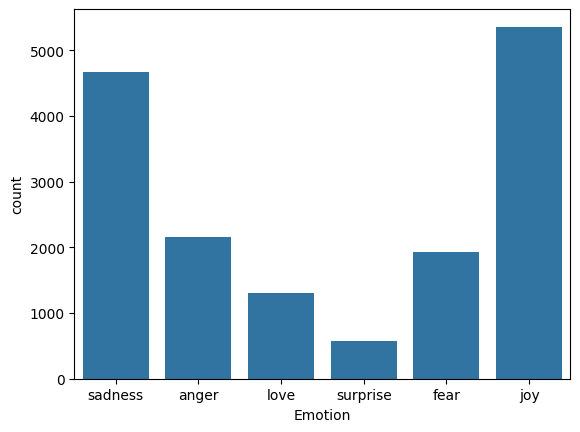

In [118]:
sns.countplot(x = train_data['Emotion'])
plt.show()
              

In [119]:
# Data distribution
df2 = train_data.copy()

In [120]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15999 entries, 0 to 15999
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Comment  15999 non-null  object
 1   Emotion  15999 non-null  object
 2   length   15999 non-null  int64 
dtypes: int64(1), object(2)
memory usage: 500.0+ KB


In [121]:
# convert the length column to numpy array
length_values = df2['length'].values
length_values

array([ 23, 108,  48, ...,  30,  59,  62], dtype=int64)

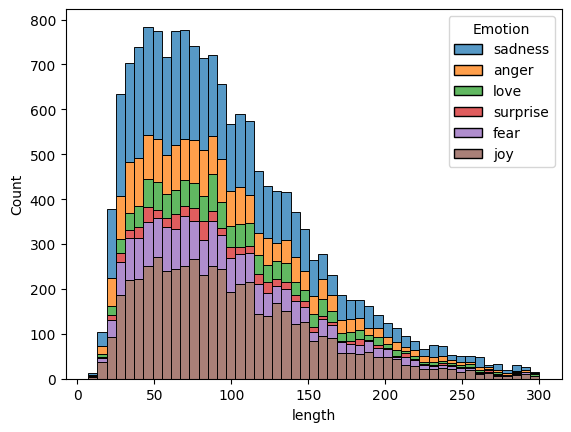

In [122]:
# use histogram plot to check data disribution
sns.histplot(data=df2, x='length', hue='Emotion', multiple='stack')
plt.show()
# Maximum length of setence is 300
# hue='Emotion' - showing emotion in colors

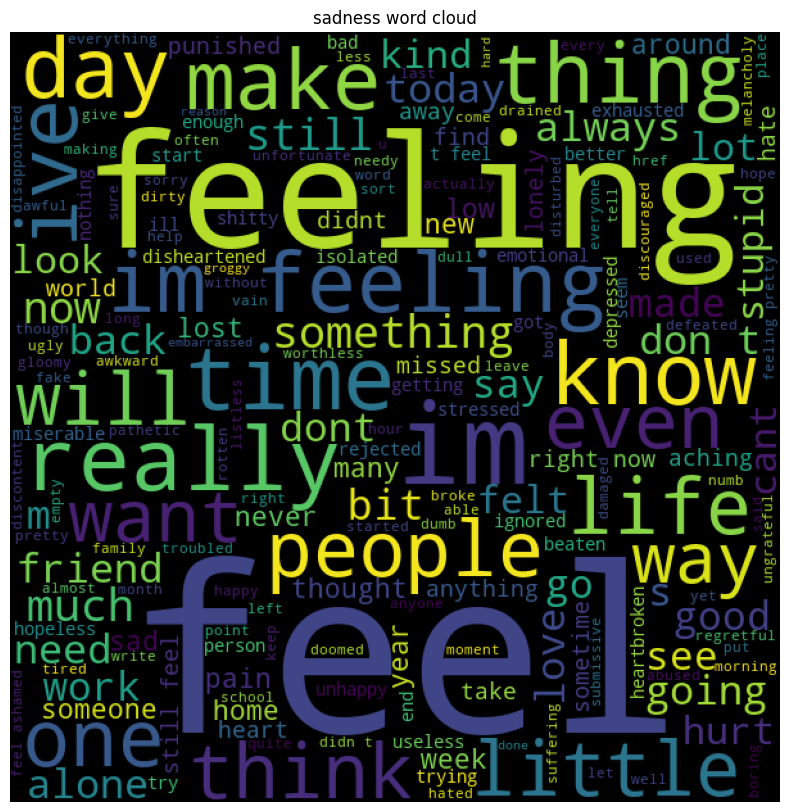

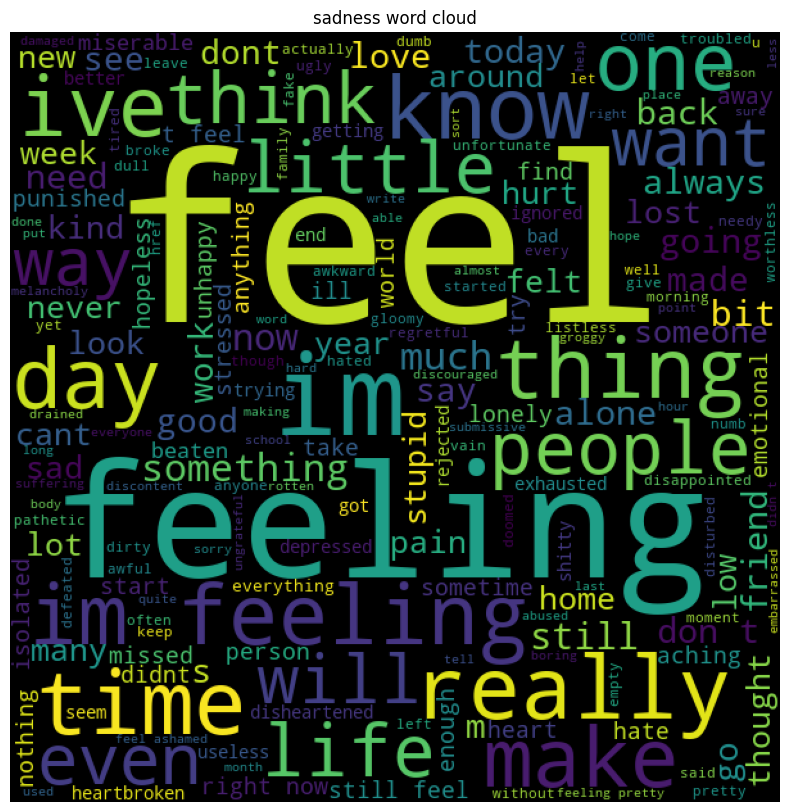

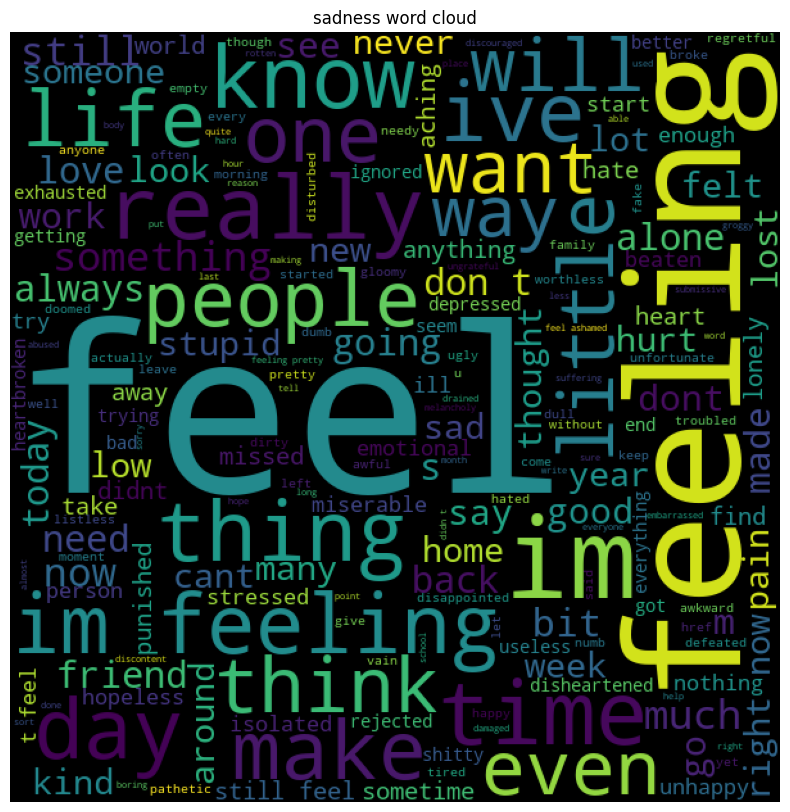

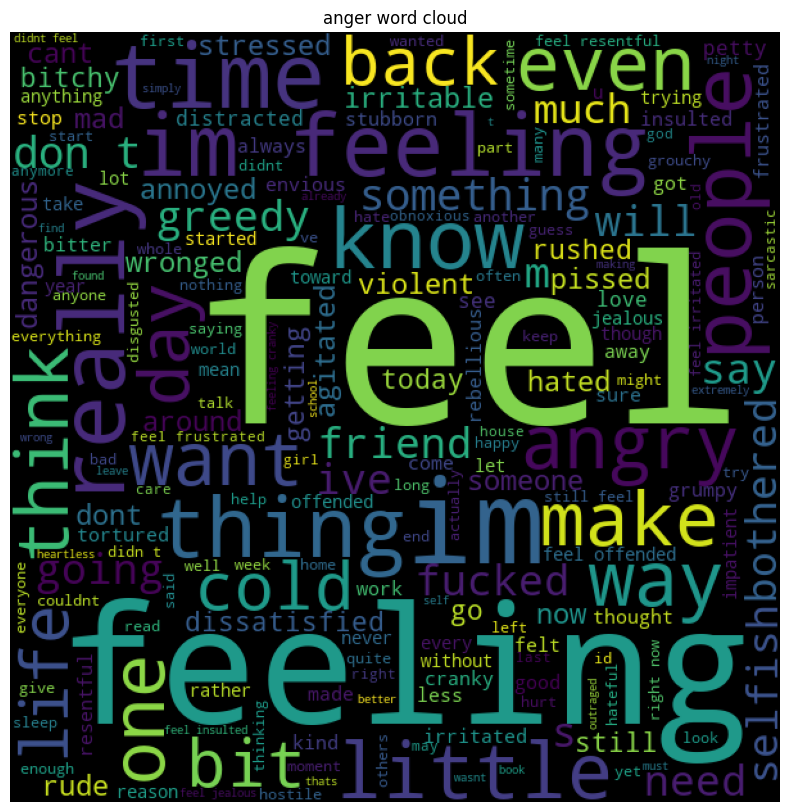

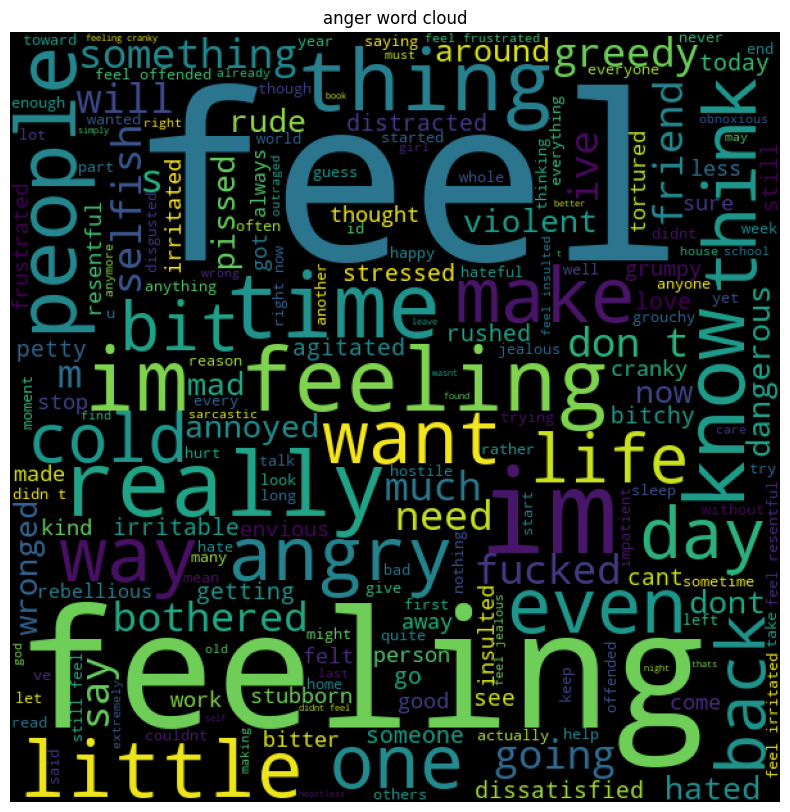

...

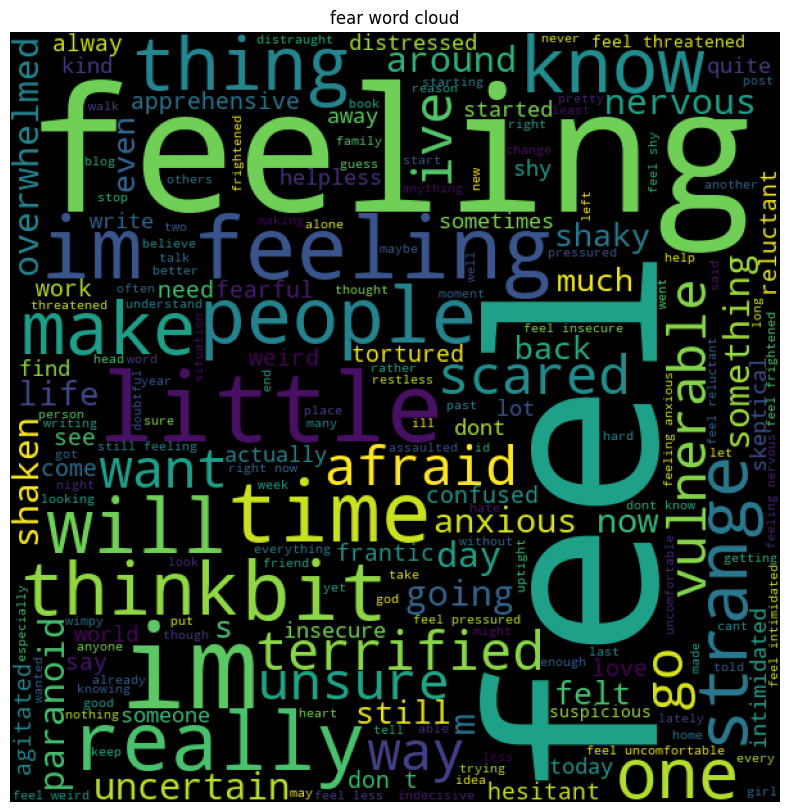

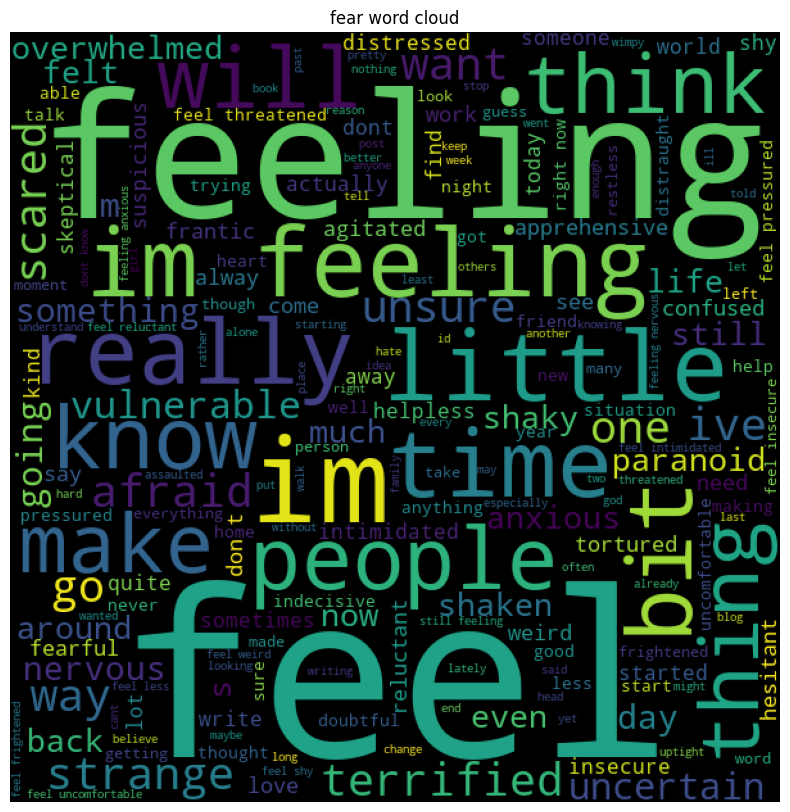

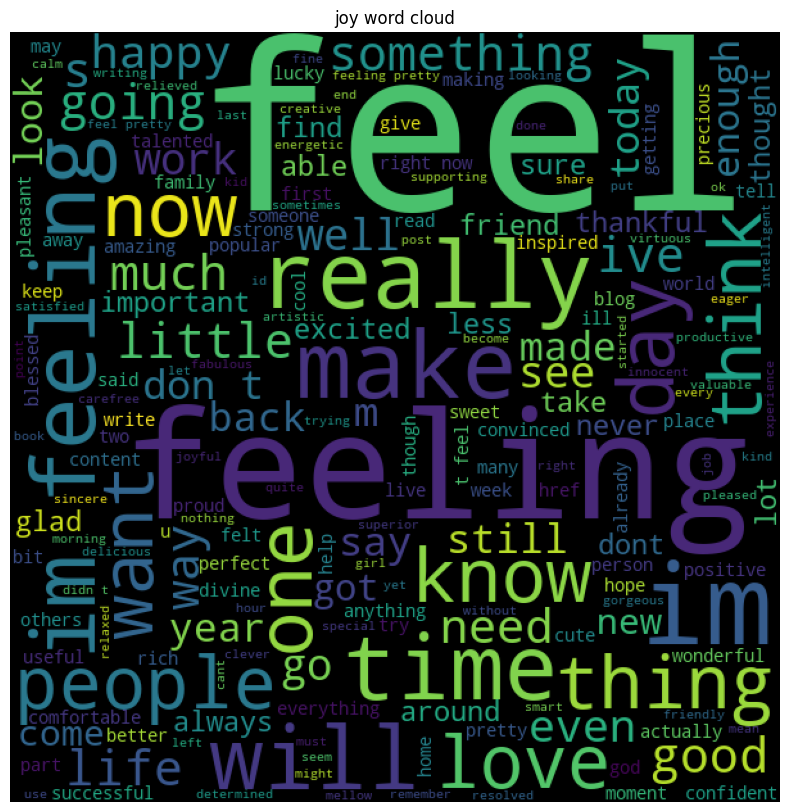

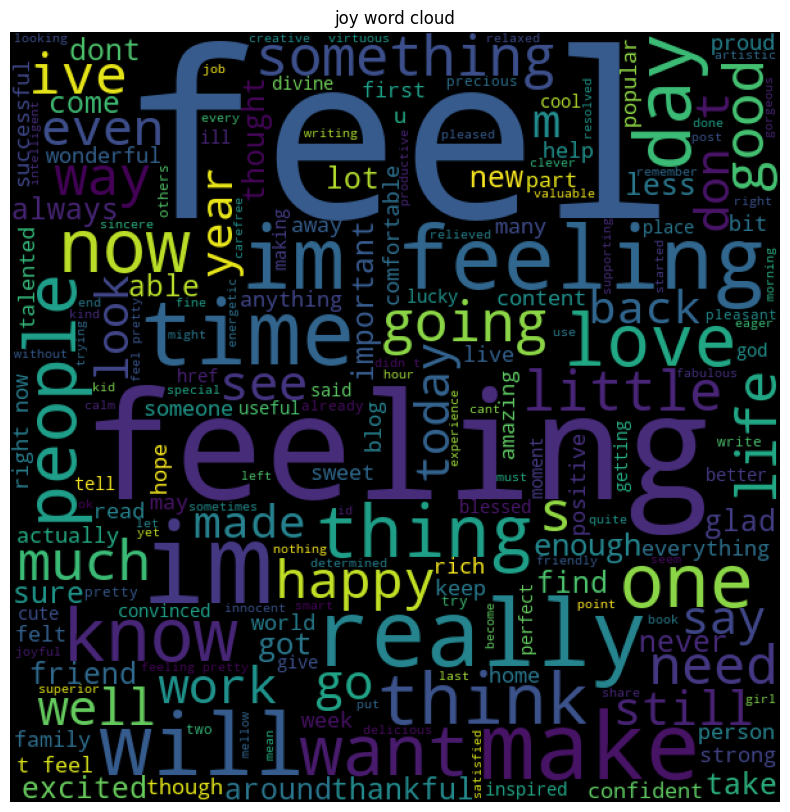

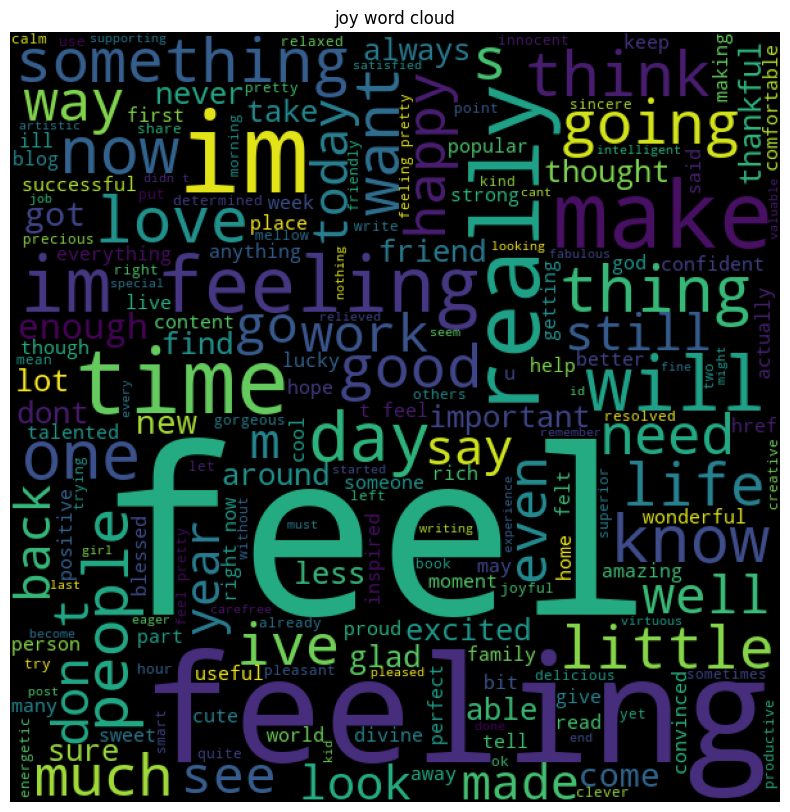

In [123]:
# word cloud for each emotions
def words_cloud(wordcloud, emotion):
    plt.figure(figsize=(10,10))
    plt.title(emotion+ " word cloud")
    plt.imshow(wordcloud)
    plt.axis("off")

emotions_list = train_data['Emotion'].unique()
for emotion in emotions_list:
    # first take sadness sentence are around 5000, so loop iterate 5000 times
    for setence in train_data:
        text = " ".join([sentence for sentence in train_data.loc[train_data['Emotion']==emotion,'Comment']])
        # most times a partular word is in senetence using will be stored in wordcloud variable
        wordcloud = WordCloud(width=600, height=600).generate(text)
        words_cloud(wordcloud, emotion)

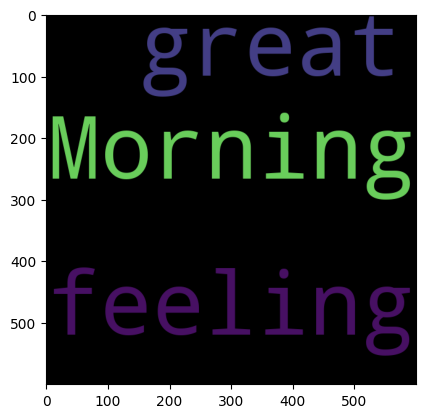

In [124]:
text = "I am feeling great from Morning"
wc = WordCloud(width=600, height=600).generate(text)
plt.imshow(wc)

In [126]:
# data preprocessing
# enode emotion - label encoding
lb = LabelEncoder()
train_data['Emotion_Encoded'] = lb.fit_transform(train_data['Emotion'])

In [127]:
train_data

,Comment,Emotion,length,Emotion_Encoded
0,i didnt feel humiliated,sadness,23,4
1,i can go from feeling so hopeless to so damned...,sadness,108,4
2,im grabbing a minute to post i feel greedy wrong,anger,48,0
3,i am ever feeling nostalgic about the fireplac...,love,92,3
4,i am feeling grouchy,anger,20,0
...,...,...,...,...
15995,i just had a very brief time in the beanbag an...,sadness,101,4
15996,i am now turning and i feel pathetic that i am...,sadness,102,4
15997,i feel strong and good overall,joy,30,2
15998,i feel like this was such a rude comment and i...,anger,59,0


In [128]:
# Apply the machine learning Algoritham
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB  # multiclass
from sklearn.linear_model import LogisticRegression  # multiclass important
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report

In [129]:
df = train_data.copy()

In [130]:
df

,Comment,Emotion,length,Emotion_Encoded
0,i didnt feel humiliated,sadness,23,4
1,i can go from feeling so hopeless to so damned...,sadness,108,4
2,im grabbing a minute to post i feel greedy wrong,anger,48,0
3,i am ever feeling nostalgic about the fireplac...,love,92,3
4,i am feeling grouchy,anger,20,0
...,...,...,...,...
15995,i just had a very brief time in the beanbag an...,sadness,101,4
15996,i am now turning and i feel pathetic that i am...,sadness,102,4
15997,i feel strong and good overall,joy,30,2
15998,i feel like this was such a rude comment and i...,anger,59,0


In [131]:
# Data Cleaning and Data preprocessing
nltk.corpus.stopwords.words('english')

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [134]:
# convert all above stopwords list to set
stopwords = set(nltk.corpus.stopwords.words('english'))

def clean_text(text):
    stemmer = PorterStemmer()
    # [^a-zA-Z] - replace spaces other than characters for a-z and A-Z .. other that this give space like digit % 
    text = re.sub("[^a-zA-Z]", " ", text)
    text = text.lower()
    # convert the string into list based on the space
    text = text.split()
    text = [stemmer.stem(word) for word in text if word not in stopwords]
    # convert list to string use join()
    return " ".join(text)


In [135]:
clean_text(" I am 2324 % loving hating")

'love hate'

In [136]:
df['cleaned_comment'] = df['Comment'].apply(clean_text)

In [137]:
df

,Comment,Emotion,length,Emotion_Encoded,cleaned_comment
0,i didnt feel humiliated,sadness,23,4,didnt feel humili
1,i can go from feeling so hopeless to so damned...,sadness,108,4,go feel hopeless damn hope around someon care ...
2,im grabbing a minute to post i feel greedy wrong,anger,48,0,im grab minut post feel greedi wrong
3,i am ever feeling nostalgic about the fireplac...,love,92,3,ever feel nostalg fireplac know still properti
4,i am feeling grouchy,anger,20,0,feel grouchi
...,...,...,...,...,...
15995,i just had a very brief time in the beanbag an...,sadness,101,4,brief time beanbag said anna feel like beaten
15996,i am now turning and i feel pathetic that i am...,sadness,102,4,turn feel pathet still wait tabl sub teach degre
15997,i feel strong and good overall,joy,30,2,feel strong good overal
15998,i feel like this was such a rude comment and i...,anger,59,0,feel like rude comment im glad


In [138]:
# train test split
X_train, X_test, y_train, y_test = train_test_split(df['cleaned_comment'], df['Emotion_Encoded'], test_size=0.2, random_state=42)


In [145]:
X_train

676      refer cours though cant help feel somehow iron...
14180           would feel awkward someon tell feel toward
7077     feel like probabl would like book littl bit si...
13004    ive slow take time listen child moment feel li...
10264                         feel vital rlsh gimmick need
                               ...                        
13418         love leav reader feel confus slightli deceiv
5390                                            feel delic
860                                start feel littl stress
15796      feel accept music critic reinforc concept music
7270             feel someon rude wrongli done someth lose
Name: cleaned_comment, Length: 12799, dtype: object

In [146]:
y_train

676      2
14180    4
7077     3
13004    2
10264    2
        ..
13418    1
5390     3
860      4
15796    2
7270     0
Name: Emotion_Encoded, Length: 12799, dtype: int32

In [147]:
X_test

8756                             ive made week feel beaten
4660                               feel strategi worthwhil
6095                     feel worthless weak say want find
304                                        feel clever nov
8241                          im move ive feel kind gloomi
                               ...                        
15578    feel use pulpit find iron often question effic...
5746                   dri bladder readi day im feel brave
6395                                feel thrill matter day
7624     woke morn text mr c declar walk work type mile...
15245                                            feel dumb
Name: cleaned_comment, Length: 3200, dtype: object

In [148]:
y_test

8756     4
4660     2
6095     4
304      2
8241     4
        ..
15578    2
5746     2
6395     2
7624     2
15245    4
Name: Emotion_Encoded, Length: 3200, dtype: int32

In [140]:
# vectorizarion
tfidf_vectorizer = TfidfVectorizer()
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)
X_test_tfidf = tfidf_vectorizer.transform(X_test)

In [144]:
X_train_tfidf.shape

(12799, 9243)

In [143]:
X_test_tfidf.shape

(3200, 9243)

In [31]:
# Multi-class classification using different algorithms
classifiers = {
    "Multinomial Naive Bayes": MultinomialNB(),
    "Logistic Regression": LogisticRegression(),
    "Random Forest": RandomForestClassifier(),
    "Support Vector Machine": SVC(),
}

for name, clf in classifiers.items():
    print(f"\n===== {name} =====")
    clf.fit(X_train_tfidf, y_train)
    y_pred_tfidf = clf.predict(X_test_tfidf)
    accuracy_tfidf = accuracy_score(y_test, y_pred_tfidf)
    print(f"\nAccuracy using TF-IDF: {accuracy_tfidf}")
    print("Classification Report:")
    print(classification_report(y_test, y_pred_tfidf))


===== Multinomial Naive Bayes =====

Accuracy using TF-IDF: 0.6590625
Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.32      0.48       439
           1       0.88      0.23      0.37       375
           2       0.58      0.98      0.73      1027
           3       1.00      0.03      0.05       303
           4       0.72      0.91      0.80       950
           5       1.00      0.02      0.04       106

    accuracy                           0.66      3200
   macro avg       0.85      0.42      0.41      3200
weighted avg       0.76      0.66      0.59      3200


===== Logistic Regression =====


C:\Users\Amit\OneDrive\Desktop\project-image detection-security\tfvenv\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(



Accuracy using TF-IDF: 0.8240625
Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.78      0.83       439
           1       0.85      0.72      0.78       375
           2       0.76      0.94      0.84      1027
           3       0.83      0.46      0.59       303
           4       0.88      0.92      0.90       950
           5       0.74      0.46      0.57       106

    accuracy                           0.82      3200
   macro avg       0.82      0.71      0.75      3200
weighted avg       0.83      0.82      0.82      3200


===== Random Forest =====

Accuracy using TF-IDF: 0.8546875
Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.87      0.84       439
           1       0.83      0.87      0.85       375
           2       0.85      0.90      0.87      1027
           3       0.83      0.61      0.70       303
           4       0.92      0.89      0.90  

In [154]:
# selecting model
lg = LogisticRegression()
lg.fit(X_train_tfidf, y_train)
y_pred_lg = lg.predict(X_test_tfidf)

C:\Users\Amit\OneDrive\Desktop\project-image detection-security\tfvenv\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [151]:
tfidf_vectorizer.transform??

Signature: tfidf_vectorizer.transform(raw_documents)
Source:   
    def transform(self, raw_documents):
        """Transform documents to document-term matrix.

        Uses the vocabulary and document frequencies (df) learned by fit (or
        fit_transform).

        Parameters
        ----------
        raw_documents : iterable
            An iterable which generates either str, unicode or file objects.

        Returns
        -------
        X : sparse matrix of (n_samples, n_features)
            Tf-idf-weighted document-term matrix.
        """
        check_is_fitted(self, msg="The TF-IDF vectorizer is not fitted")

        X = super().transform(raw_documents)
        return self._tfidf.transform(X, copy=False)
File:      c:\users\amit\onedrive\desktop\project-image detection-security\tfvenv\lib\site-packages\sklearn\feature_extraction\text.py
Type:      method

In [167]:
# Prediction
def predict_emotion(input_text):
    # cleaned_text () - below things
    # 1. replace the space if digit special characters 
    # 2. Do the splitting the word based on the spaces..sentence converted into list
    # 3. Do the word in the lower form
    # 4. remove the stopwords
    # 5. Once done all opeartion it return the list
    # 6. convert list into string using .join() method and return
    cleaned_text = clean_text(input_text)
    # below code given code as - Iterable over raw text documents expected, string object received.[cleaned_text] means bracket given then
    input_vectorized = tfidf_vectorizer.transform([cleaned_text])
    #print(input_vectorized[0])
   # 0 ko anger main dikhna hai
  # Predict emotion
    predicted_label = lg.predict(input_vectorized)[0]
    #print(predicted_label)
    predicted_emotion = lb.inverse_transform([predicted_label])[0]
    #print(predicted_emotion)
    label =  np.max(lg.predict(input_vectorized))
    #print(label)

    return predicted_emotion,label

# Example usage 
sentences = [
            "i didnt feel humiliated",
            "i feel strong and good overall",
            "im grabbing a minute to post i feel greedy wrong",
            "He was speechles when he found out he was accepted to this new job",
            "This is outrageous, how can you talk like that?",
            "I feel like im all alone in this world",
            "He is really sweet and caring",
            "You made me very crazy",
            "i am ever feeling nostalgic about the fireplace i will know that it is still on the property",
            "i am feeling grouchy",
            "He hates you"
            ]

for sentence in sentences:
    print(sentence)
    pred_emotion, label = predict_emotion(sentence)
    print("Prediction :",pred_emotion)
    print("Label :",label)
    print("================================================================")

i didnt feel humiliated
Prediction : sadness
Label : 4
i feel strong and good overall
Prediction : joy
Label : 2
im grabbing a minute to post i feel greedy wrong
Prediction : anger
Label : 0
He was speechles when he found out he was accepted to this new job
Prediction : joy
Label : 2
This is outrageous, how can you talk like that?
Prediction : anger
Label : 0
I feel like im all alone in this world
Prediction : sadness
Label : 4
He is really sweet and caring
Prediction : love
Label : 3
You made me very crazy
Prediction : sadness
Label : 4
i am ever feeling nostalgic about the fireplace i will know that it is still on the property
Prediction : love
Label : 3
i am feeling grouchy
Prediction : anger
Label : 0
He hates you
Prediction : anger
Label : 0


In [39]:
# save files
import pickle
pickle.dump(lg,open("logistic_regresion.pkl",'wb'))
pickle.dump(lb,open("label_encoder.pkl",'wb'))
pickle.dump(tfidf_vectorizer,open("tfidf_vectorizer.pkl",'wb'))

In [40]:
import sklearn
print(sklearn.__version__) # use this version in pycharm

1.3.2


In [41]:
# Deep learning model using LSTM
train_data

,Comment,Emotion,length,Emotion_Encoded
0,i didnt feel humiliated,sadness,23,4
1,i can go from feeling so hopeless to so damned...,sadness,108,4
2,im grabbing a minute to post i feel greedy wrong,anger,48,0
3,i am ever feeling nostalgic about the fireplac...,love,92,3
4,i am feeling grouchy,anger,20,0
...,...,...,...,...
15995,i just had a very brief time in the beanbag an...,sadness,101,4
15996,i am now turning and i feel pathetic that i am...,sadness,102,4
15997,i feel strong and good overall,joy,30,2
15998,i feel like this was such a rude comment and i...,anger,59,0


In [42]:
max([len(w) for w in train_data['Comment']])

300

In [43]:
min([len(w) for w in train_data['Comment']])

7

In [47]:
text = " ".join(["I love myself","I hate you", "we love outself"])
text

'I love myself I hate you we love outself'

In [48]:
one_hot(input_text = text, n=40)
# Assign the value for each word between 1- 40
#'I love myself I hate you we love outself'
#[7, 11, 38,    7,37,  15, 7, 11,  30]

[7, 11, 38, 7, 37, 15, 7, 11, 30]

In [45]:
stopwords = set(nltk.corpus.stopwords.words('english'))

In [58]:
# text clean
def clean_text(df, column, vocab_size, max_len):
    stemmer = PorterStemmer()

    corpus = []
    for text in df[column]:
        text = re.sub("^[a-zA-z]", " ", text)
        text = text.lower()
        text = text.split()
        text = [stemmer.stem(w) for w in text if w not in stopwords]
        text = " ".join(text)
        corpus.append(text)
    one_hot_word = [one_hot(input_text= word, n=vocab_size) for word in corpus]
    pad = pad_sequences(sequences=one_hot_word, maxlen=max_len, padding='pre')
    return pad                        
        
x_train = clean_text(train_data, 'Comment', vocab_size = 11000, max_len=300)


In [60]:
x_train.shape

(15999, 300)

In [56]:
lb = LabelEncoder()
train_data['Emotion'] = lb.fit_transform(train_data['Emotion'])
y_train = to_categorical(train_data["Emotion"])

In [57]:
y_train

array([[0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1., 0.],
       [1., 0., 0., 0., 0., 0.],
       ...,
       [0., 0., 1., 0., 0., 0.],
       [1., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1., 0.]], dtype=float32)

In [61]:
# Build and compile the model
model = Sequential()  # linear stack layer banane help
# embedding - word 
model.add(Embedding(input_dim=11000, output_dim=150, input_length=300))
# to avoid overfitting
model.add(Dropout(0.2))
model.add(LSTM(128))
model.add(Dropout(0.2))
model.add(Dense(64, activation='sigmoid'))
model.add(Dropout(0.2))
model.add(Dense(6, activation='softmax'))
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
callback = EarlyStopping(monitor="val_loss", patience=2, restore_best_weights=True)
model.fit(x_train, y_train, epochs=5, batch_size=64, verbose=1, callbacks=[callback])

Epoch 1/5
250/250 [==============================] - 129s 505ms/step - loss: 1.5031 - accuracy: 0.4000
Epoch 2/5
250/250 [==============================] - 133s 532ms/step - loss: 0.7036 - accuracy: 0.7676
Epoch 3/5
250/250 [==============================] - 143s 572ms/step - loss: 0.3296 - accuracy: 0.8886
Epoch 4/5
250/250 [==============================] - 142s 569ms/step - loss: 0.2205 - accuracy: 0.9246
Epoch 5/5
250/250 [==============================] - 139s 556ms/step - loss: 0.1648 - accuracy: 0.9444


In [62]:
# Text cleaning function
def sentence_cleaning(sentence):
    stemmer = PorterStemmer()
    corpus = []
    text = re.sub("[^a-zA-Z]", " ", sentence)
    text = text.lower()
    text = text.split()
    text = [stemmer.stem(word) for word in text if word not in stopwords]
    text = " ".join(text)
    corpus.append(text)
    one_hot_word = [one_hot(input_text=word, n=11000) for word in corpus]
    pad = pad_sequences(sequences=one_hot_word, maxlen=300, padding='pre')
    return pad

# load model and predict 
sentences = [
            "i feel strong and good overall",
            "im grabbing a minute to post i feel greedy wrong",
            "He was speechles when he found out he was accepted to this new job",
            "This is outrageous, how can you talk like that?",
            "I feel like im all alone in this world",
            "He is really sweet and caring",
            "You made me very crazy",
            "i am ever feeling nostalgic about the fireplace i will know that it is still on the property",
            "i am feeling grouchy",
            "He hates you"
            ]
for sentence in sentences:
    print(sentence)
    sentence = sentence_cleaning(sentence)
    result = lb.inverse_transform(np.argmax(model.predict(sentence), axis=-1))[0]
    proba =  np.max(model.predict(sentence))
    print(f"{result} : {proba}\n\n")

i feel strong and good overall
1/1 [==============================] - 0s 37ms/step
joy : 0.996044397354126


im grabbing a minute to post i feel greedy wrong
1/1 [==============================] - 0s 46ms/step
anger : 0.9906532764434814


He was speechles when he found out he was accepted to this new job
1/1 [==============================] - 0s 42ms/step
joy : 0.7880157232284546


This is outrageous, how can you talk like that?
1/1 [==============================] - 0s 41ms/step
anger : 0.5054066777229309


I feel like im all alone in this world
1/1 [==============================] - 0s 43ms/step
sadness : 0.9631563425064087


He is really sweet and caring
1/1 [==============================] - 0s 45ms/step
love : 0.763489305973053


You made me very crazy
1/1 [==============================] - 0s 41ms/step
joy : 0.7212507128715515


i am ever feeling nostalgic about the fireplace i will know that it is still on the property
1/1 [==============================] - 0s 40ms/step
love : 0

In [63]:
model.save('model1.h5')

# Save the LabelEncoder
with open('lb1.pkl', 'wb') as f:
    pickle.dump(lb, f)

# Save vocabulary size and max length
vocab_info = {'vocab_size': 11000, 'max_len': 300}
with open('vocab_info.pkl', 'wb') as f:
    pickle.dump(vocab_info, f)

C:\Users\Amit\OneDrive\Desktop\project-image detection-security\tfvenv\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [64]:
# use this version
import tensorflow
import keras
print(keras.__version__)
print(tensorflow.__version__)

2.13.1
2.13.0
